# Dataset Overview #

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


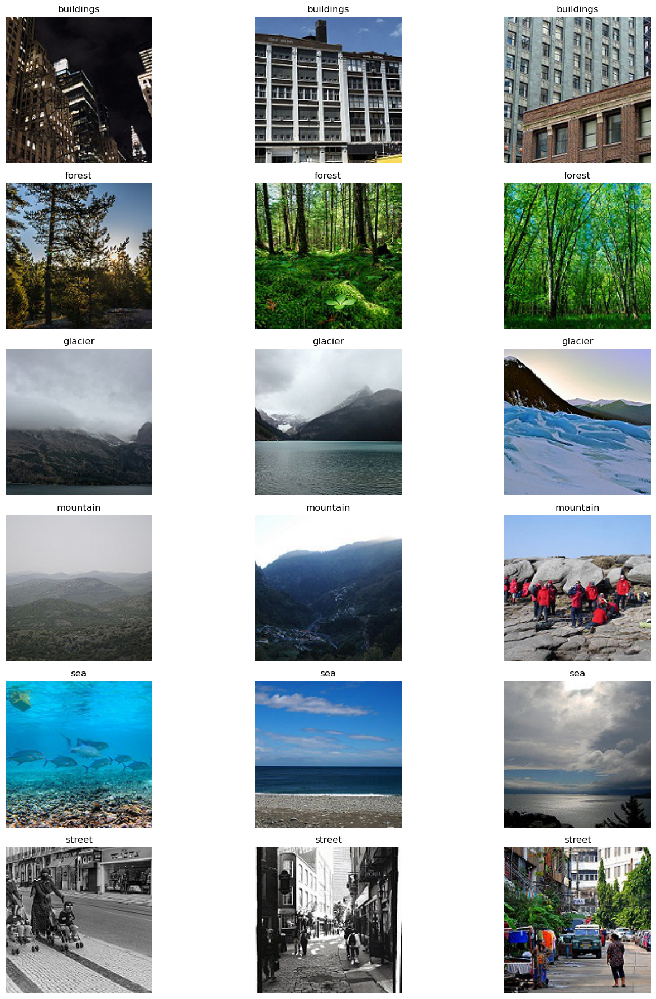

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from collections import Counter
import seaborn as sns

path = '/Users/jasonzhao/Documents/171project/inteldata/seg_train/seg_train'
#stores list of folders in this path in alph order
classes = sorted(os.listdir(path))

#remove this metadata file from classes
if '.DS_Store' in classes:
    classes.remove('.DS_Store')
print(classes)
def plot_images(datasetPath, classes, samples_per_class=3):
    plt.figure(figsize=(15,len(classes)*3))
    for i, class_name in enumerate(classes):
        # navigate to each class
        class_folder = os.path.join(path,class_name)
        #list of selected sample of images in the folder
        image_files = os.listdir(class_folder)[:samples_per_class]
        for j, image_name in enumerate(image_files):
            img_path = os.path.join(class_folder, image_name)
            #opens image file
            image = Image.open(img_path)
            #rows,cols, idx placement of image
            plt.subplot(len(classes), samples_per_class, i * samples_per_class + j + 1)
            #displays the image
            plt.imshow(image)
            plt.title(class_name)
            plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_images(path, classes)
            

        
    
    


Sample training images:


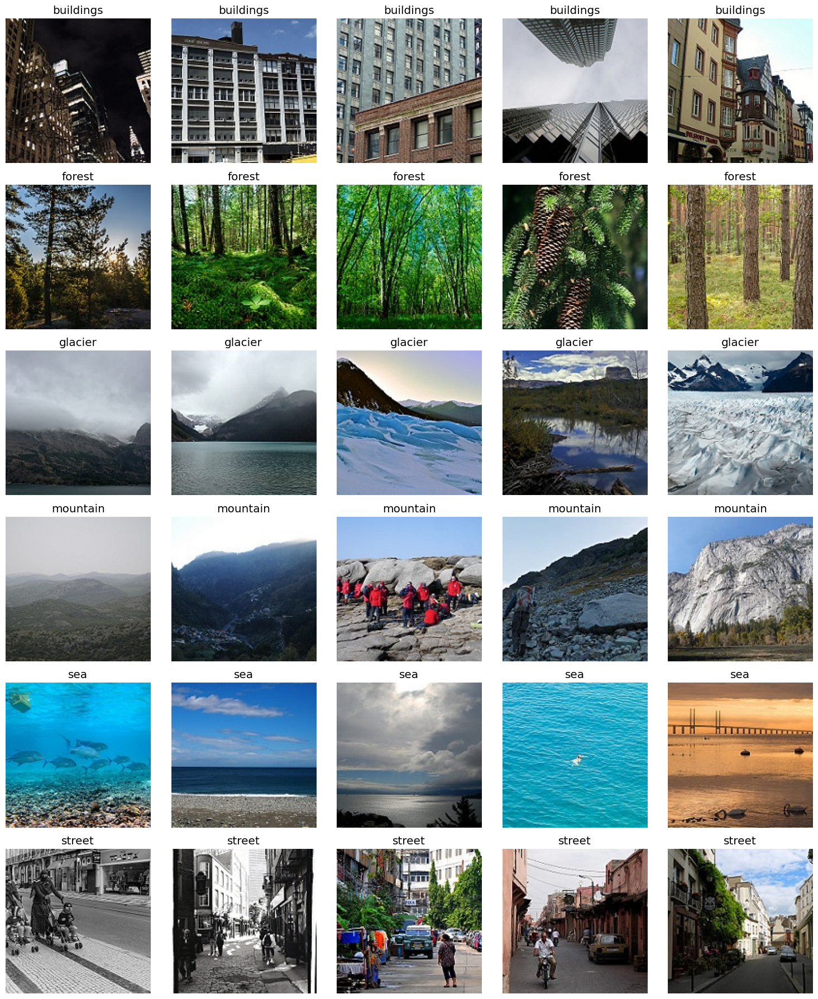

In [ ]:
# Display sample images 
def plot_images(datasetPath, classes, samples_per_class=5):
    plt.figure(figsize=(15, len(classes)*3))
    for i, class_name in enumerate(classes):
        class_folder = os.path.join(datasetPath, class_name)
        image_files = [f for f in os.listdir(class_folder) if not f.startswith('.')][:samples_per_class]
        for j, image_name in enumerate(image_files):
            img_path = os.path.join(class_folder, image_name)
            image = Image.open(img_path)
            plt.subplot(len(classes), samples_per_class, i * samples_per_class + j + 1)
            plt.imshow(image)
            plt.title(class_name)
            plt.axis('off')
    plt.tight_layout()
    plt.show()

print("\nSample training images:")
plot_images(train_path, classes)

# Analyze image dimensions
def get_image_dimensions(dataset_path, sample_size=100):
    dimensions = []
    for class_name in classes:
        class_folder = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_folder) if not f.startswith('.')][:sample_size]
        for image_name in image_files:
            try:
                with Image.open(os.path.join(class_folder, image_name)) as img:
                    dimensions.append(img.size)
            except Exception as e:
                print(f"Error processing {os.path.join(class_folder, image_name)}: {e}")
    return dimensions

train_dimensions = get_image_dimensions(train_path)
widths, heights = zip(*train_dimensions)


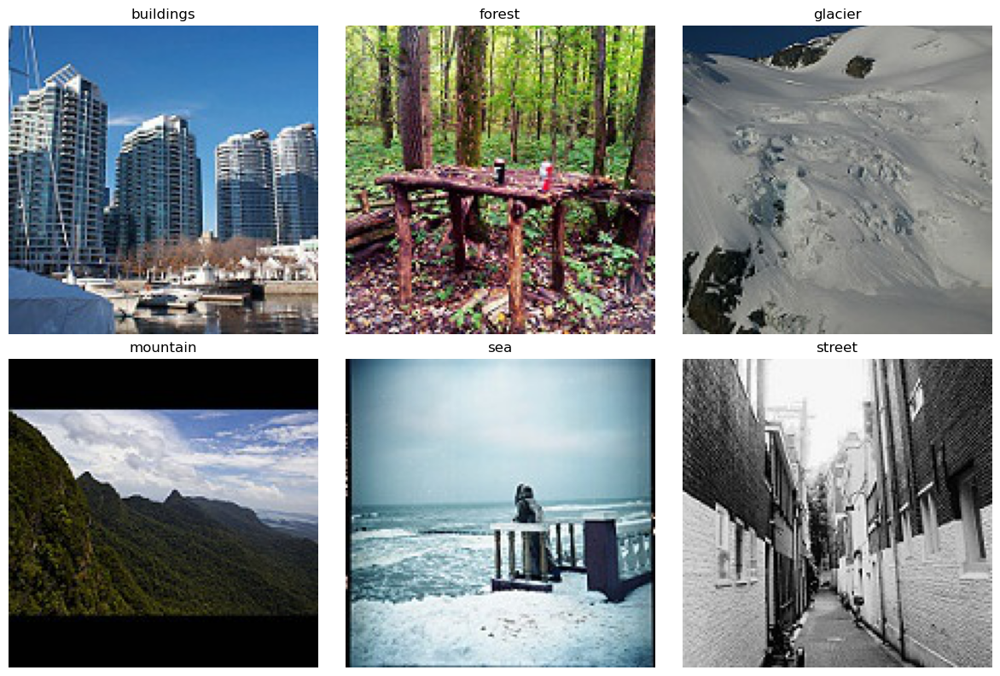

In [ ]:
# Display a few sample images per class
import random

plt.figure(figsize=(12, 8))
for i, cls in enumerate(classes):
    # pick a random image file
    fname = random.choice(os.listdir(os.path.join(base_dir, cls)))
    img = Image.open(os.path.join(base_dir, cls, fname))
    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis("off")

plt.tight_layout()
plt.show()

# Dataset Structure and Distribution #

/var/folders/jk/dfnkht451fbbbc3v23fdkfz80000gn/T/ipykernel_70653/4176027480.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='Class', y='Image Count', palette='viridis')


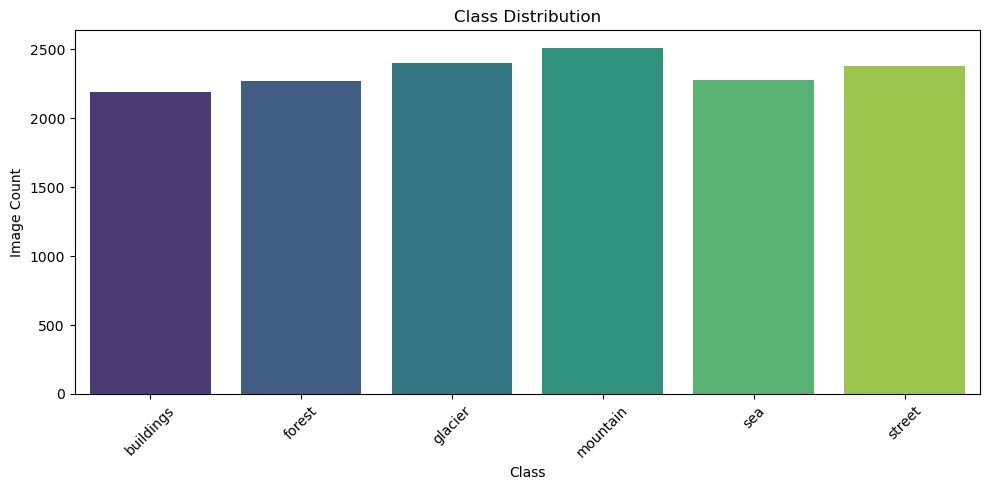

       Class  Image Count
0  buildings         2191
1     forest         2271
2    glacier         2404
3   mountain         2512
4        sea         2274
5     street         2382


In [ ]:
def get_class_distribution(dataset_path, classes):
    class_counts = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}
    df = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Image Count'])
    plt.figure(figsize=(10, 5))
    sns.barplot(data=df, x='Class', y='Image Count', palette='viridis')
    plt.title('Class Distribution')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    return df

distribution_df = get_class_distribution(path, classes)
print(distribution_df)

In [ ]:
def inspect_image_shapes_and_formats(dataset_path, classes):
    shapes = []
    formats = []

    for cls in classes:
        class_path = os.path.join(dataset_path, cls)
        image_files = os.listdir(class_path)
        for image_file in image_files:
            img_path = os.path.join(class_path, image_file)
            try:
                with Image.open(img_path) as img:
                    shapes.append(img.size)
                    formats.append(img.format)
            except Exception as e:
                print(f"Failed to open {img_path}: {e}")
                
    #Count how many times a size and format occurs
    shape_counts = Counter(shapes)
    format_counts = Counter(formats)

    print("\nMost common image sizes:")
    for shape, count in shape_counts.most_common(5):
        print(f"{shape}: {count} images")

    print("\nImage format distribution:")
    for fmt, count in format_counts.items():
        print(f"{fmt}: {count} images")

inspect_image_shapes_and_formats(path, classes)


Most common image sizes:
(150, 150): 13986 images
(150, 113): 7 images
(150, 135): 3 images
(150, 111): 3 images
(150, 108): 2 images

Image format distribution:
JPEG: 14034 images


In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from collections import Counter
import seaborn as sns
import numpy as np

# Set style for plots
plt.style.use('ggplot')
%matplotlib inline

# Define paths 
# Correct paths 
train_path = '/Users/kkxkaren/Desktop/ECS/ECS_171_project/seg_train'  
test_path = '/Users/kkxkaren/Desktop/ECS/ECS_171_project/seg_test'    
# Verify paths exist
if not os.path.exists(train_path):
    raise FileNotFoundError(f"Training folder not found at: {train_path}")
if not os.path.exists(test_path):
    raise FileNotFoundError(f"Test folder not found at: {test_path}")

# Get class names 
classes = sorted(os.listdir(train_path))
if '.DS_Store' in classes:
    classes.remove('.DS_Store')
print("Class names:", classes)


Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [ ]:
# Count number of images in each class
train_counts = Counter()
test_counts = Counter()

for class_name in classes:
    class_folder = os.path.join(train_path, class_name)
    train_counts[class_name] = len([f for f in os.listdir(class_folder) if not f.startswith('.')])
    
    test_class_folder = os.path.join(test_path, class_name)
    test_counts[class_name] = len([f for f in os.listdir(test_class_folder) if not f.startswith('.')])

# Create DataFrame
count_df = pd.DataFrame({
    'Class': list(train_counts.keys()),
    'Train': list(train_counts.values()),
    'Test': list(test_counts.values())
})
count_df['Total'] = count_df['Train'] + count_df['Test']
count_df = count_df.sort_values('Total', ascending=False)

print("\nImage counts per class:")
display(count_df)


Image counts per class:


,Class,Train,Test,Total
3,mountain,2512,525,3037
2,glacier,2404,553,2957
5,street,2382,501,2883
4,sea,2274,510,2784
1,forest,2271,474,2745
0,buildings,2191,437,2628


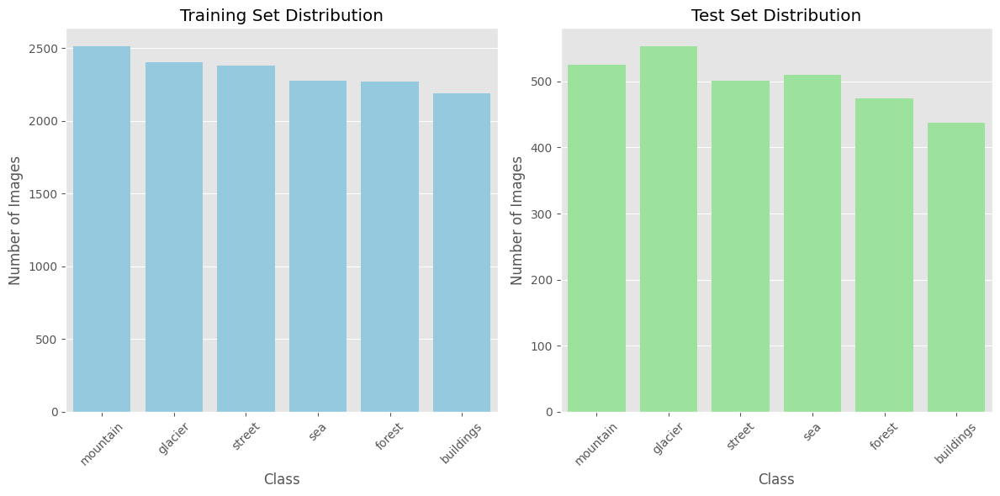

In [ ]:
# Plot class distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.barplot(data=count_df, x='Class', y='Train', color='skyblue')
plt.title('Training Set Distribution')
plt.xticks(rotation=45)
plt.ylabel('Number of Images')

plt.subplot(1, 2, 2)
sns.barplot(data=count_df, x='Class', y='Test', color='lightgreen')
plt.title('Test Set Distribution')
plt.xticks(rotation=45)
plt.ylabel('Number of Images')

plt.tight_layout()
plt.show()


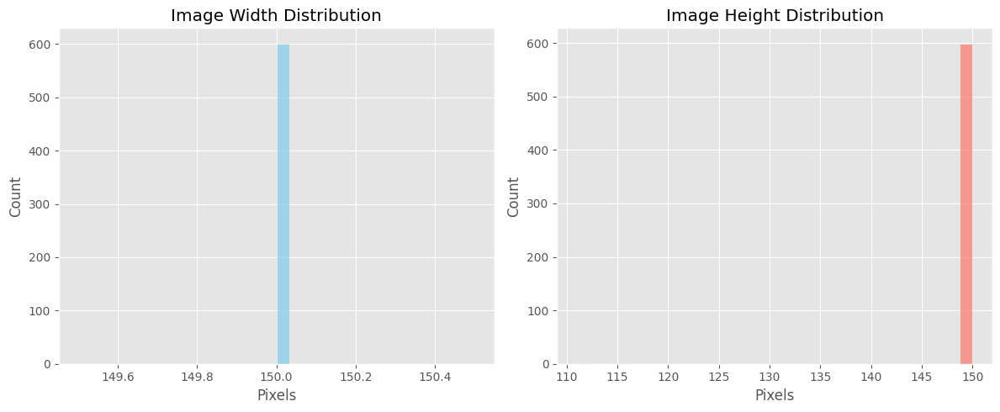

In [ ]:
# Plot dimensions
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.histplot(widths, bins=30, color='skyblue')
plt.title('Image Width Distribution')
plt.xlabel('Pixels')

plt.subplot(1, 2, 2)
sns.histplot(heights, bins=30, color='salmon')
plt.title('Image Height Distribution')
plt.xlabel('Pixels')

plt.tight_layout()
plt.show()

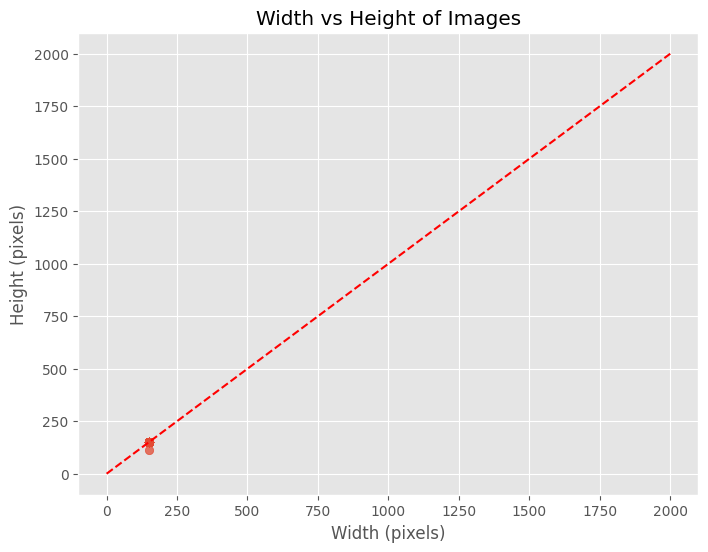

In [ ]:
# Plot width vs height scatter
plt.figure(figsize=(8, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title('Width vs Height of Images')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.plot([0, 2000], [0, 2000], 'r--')  # 1:1 aspect ratio line
plt.show()

In [ ]:
# Summary statistics
print("\nImage Dimension Statistics:")
print(f"Average width: {np.mean(widths):.1f} ± {np.std(widths):.1f} pixels")
print(f"Average height: {np.mean(heights):.1f} ± {np.std(heights):.1f} pixels")
print(f"Minimum dimensions: {min(widths)}x{min(heights)}")
print(f"Maximum dimensions: {max(widths)}x{max(heights)}")


Image Dimension Statistics:
Average width: 150.0 ± 0.0 pixels
Average height: 149.9 ± 2.1 pixels
Minimum dimensions: 150x111
Maximum dimensions: 150x150


In [ ]:
# Summary
print("\n" + "="*50)
print("EDA Summary:")
print(f"- Classes: {', '.join(classes)}")
print(f"- Total training images: {sum(train_counts.values())}")
print(f"- Total test images: {sum(test_counts.values())}")
print(f"- Average image dimensions: ~{np.mean(widths):.0f}x{np.mean(heights):.0f} pixels")
print("="*50)


EDA Summary:
- Classes: buildings, forest, glacier, mountain, sea, street
- Total training images: 14034
- Total test images: 3000
- Average image dimensions: ~150x150 pixels


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

In [ ]:
# 1. Set the path to your training data
base_dir = "archive/seg_train/seg_train"

# 2. List the classes (folders) to confirm
classes = sorted(os.listdir(base_dir))
print("Classes found:", classes)

# 3. Count images per class
class_counts = {cls: len(os.listdir(os.path.join(base_dir, cls))) 
                for cls in classes}
print("Image counts per class:")
for cls, cnt in class_counts.items():
    print(f"  {cls}: {cnt}")

Classes found: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Image counts per class:
  buildings: 2191
  forest: 2271
  glacier: 2404
  mountain: 2512
  sea: 2274
  street: 2382


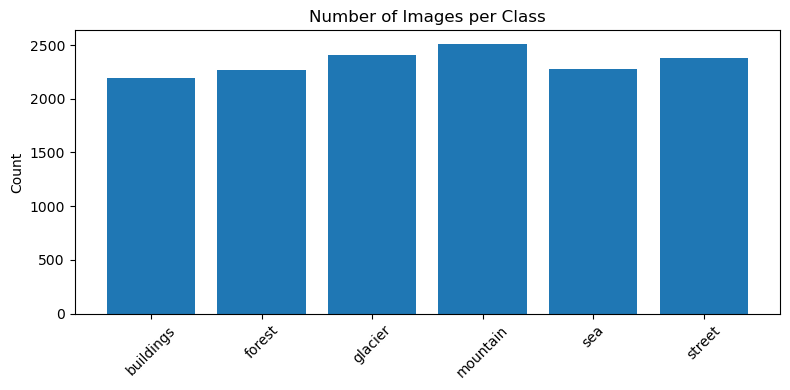

In [ ]:
# Visualize the class distribution

plt.figure(figsize=(8,4))
plt.bar(class_counts.keys(), class_counts.values())
plt.xticks(rotation=45)
plt.title("Number of Images per Class")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
# Create flattened arrays (We will be using this for MLP and Logistic Regression models):
# Remember, we do not have all of the same sized images (150 x 150). So we will have to resize all of the images to 150 x 150  pixels. 

# Find out which of the images do not have consistent sizes:

from collections import Counter
shape_counts = Counter()

for cls in classes:
    cls_path = os.path.join(base_dir, cls)
    for fname in os.listdir(cls_path):
        img = Image.open(os.path.join(cls_path, fname)).convert("RGB")
        shape_counts[img.size + (len(img.getbands()),)] += 1  # (width, height, channels)

print("Image shapes and their counts:")
for shape, cnt in shape_counts.items():
    print(f"  {shape}: {cnt}")

Image shapes and their counts:
  (150, 150, 3): 13986
  (150, 124, 3): 1
  (150, 115, 3): 1
  (150, 108, 3): 2
  (150, 136, 3): 2
  (150, 135, 3): 3
  (150, 133, 3): 1
  (150, 113, 3): 7
  (150, 111, 3): 3
  (150, 134, 3): 2
  (150, 142, 3): 2
  (150, 149, 3): 1
  (150, 76, 3): 1
  (150, 123, 3): 2
  (150, 105, 3): 1
  (150, 102, 3): 1
  (150, 143, 3): 2
  (150, 146, 3): 2
  (150, 120, 3): 1
  (150, 110, 3): 1
  (150, 97, 3): 1
  (150, 119, 3): 1
  (150, 147, 3): 1
  (150, 103, 3): 1
  (150, 131, 3): 1
  (150, 144, 3): 2
  (150, 100, 3): 1
  (150, 81, 3): 1
  (150, 141, 3): 1
  (150, 145, 3): 1
  (150, 140, 3): 1


In [ ]:
# As we can see above, we have some images not of size 150x150. 
# We resize the above outlier images to 150x150, so that we can compress it to RGB 1D arrays.

import os
from PIL import Image

target_size = (150, 150)

for root, dirs, files in os.walk(base_dir):
    for fname in files:
        if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        img_path = os.path.join(root, fname)
        img = Image.open(img_path).convert('RGB')
        if img.size != target_size:
            # Use LANCZOS resampling instead of ANTIALIAS
            img = img.resize(target_size, resample=Image.LANCZOS)
            img.save(img_path)

print("All images resized to 150×150.")

All images resized to 150×150.


In [ ]:
## Lets check if all the images are of the same size:

shape_counts = Counter()

for cls in classes:
    cls_path = os.path.join(base_dir, cls)
    for fname in os.listdir(cls_path):
        img = Image.open(os.path.join(cls_path, fname)).convert("RGB")
        shape_counts[img.size + (len(img.getbands()),)] += 1  # (width, height, channels)

print("Image shapes and their counts:")
for shape, cnt in shape_counts.items():
    print(f"  {shape}: {cnt}")

Image shapes and their counts:
  (150, 150, 3): 14034


- **`X`** is your **feature matrix**. It’s a NumPy array of shape `(N, 67500)`, where:
  - **`N`** is the total number of images you loaded.  
  - **`67500`** comes from flattening each `150×150×3` RGB image into a one-dimensional vector (`150 × 150 × 3 = 67500`).  
  - **Each row** of `X` corresponds to one image and contains its pixel values in the order:  
    ```
    [R₁, G₁, B₁, R₂, G₂, B₂, …, Rₙ, Gₙ, Bₙ]
    ```  
    where each triplet is the red, green, blue channels of a single pixel.

- **`y`** is your **label vector**. It’s a NumPy array of shape `(N,)`, where each entry is an integer in `[0…5]` indicating which class that image belongs to:
  - For example, if  
    ```python
    classes = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
    ```  
    then a `y` value of `2` means “glacier.”

---

So in effect, you have one flattened feature vector per image in `X`, and the matching class index in `y`. Together, `(X[i], y[i])` is the feature–label pair you’ll feed into your Logistic Regression or MLP models.  

In [ ]:
# 3. Initialize lists for feature vectors and labels
X = []
y = []

# 4. Loop through each class folder and each image file
for cls in classes:
    cls_path = os.path.join(base_dir, cls)
    for fname in os.listdir(cls_path):
        if not fname.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        img_path = os.path.join(cls_path, fname)
        img = Image.open(img_path).convert("RGB")
        # Convert to numpy array and flatten to 1D vector
        arr = np.array(img)               # shape: (150, 150, 3)
        X.append(arr.flatten())           # shape: (67500,)
        y.append(classes.index(cls))

# 5. Convert lists to numpy arrays
X = np.stack(X)  # shape: (N_samples, 67500)
y = np.array(y)  # shape: (N_samples,)

# 6. Display shapes
print(f"Feature matrix X shape: {X.shape}")
print(f"Label vector y shape: {y.shape}")

Feature matrix X shape: (14034, 67500)
Label vector y shape: (14034,)


Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
buildings: 2191 images
forest: 2271 images
glacier: 2404 images
mountain: 2512 images
sea: 2274 images
street: 2382 images


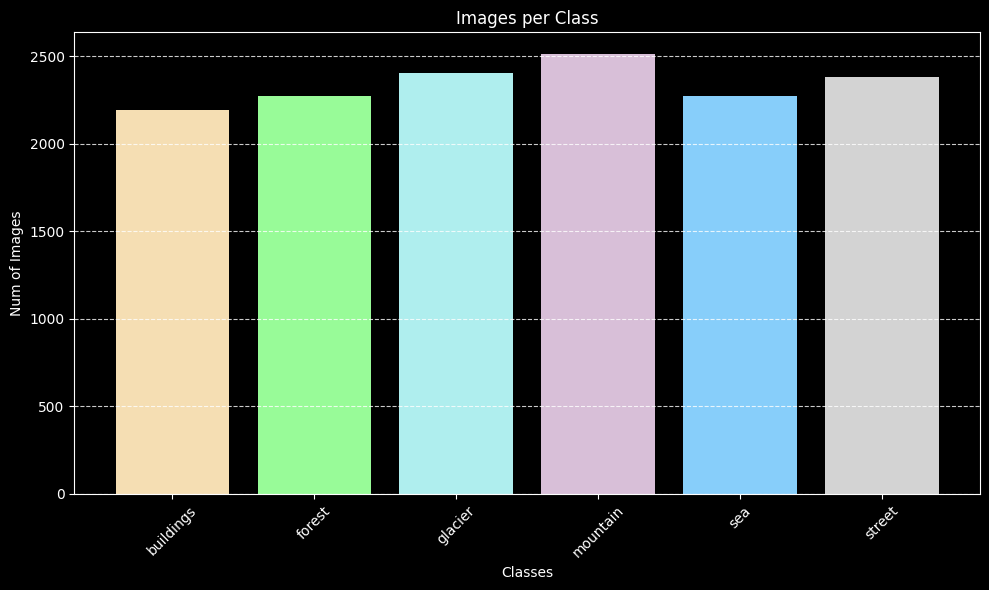

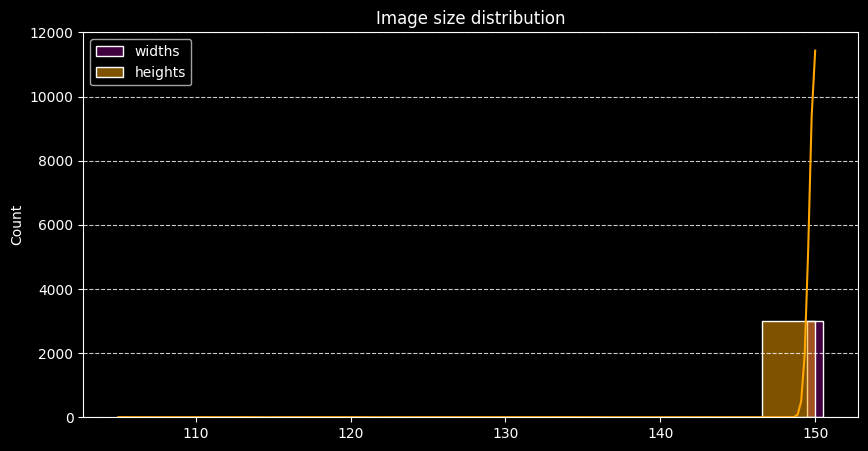

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from PIL import Image

#get path and classes
dpath = '/Users/tsamb/OneDrive/Desktop/SP25/ECS171/Project/seg_train/seg_train'
classes = os.listdir(dpath)
print("Classes:", classes)

#number of images per class
num_per_class = []
for c in classes:
    num_img = len(os.listdir(os.path.join(dpath,c)))
    print(f"{c}: {num_img} images")
    num_per_class.append(num_img)

colors = ['wheat','palegreen','paleturquoise','thistle','lightskyblue','lightgrey']
plt.style.use('dark_background')
plt.figure(figsize=(10,6))
plt.bar(classes,num_per_class,color=colors[:len(classes)])
plt.xlabel('Classes')
plt.ylabel('Num of Images')
plt.title('Images per Class')
plt.xticks(rotation=45)
plt.grid(axis='y',linestyle='--',alpha=0.8)
plt.tight_layout()

#get image stats
imgShapes = []
for c in classes:
    for fname in os.listdir(os.path.join(dpath,c))[:500]:
        path = os.path.join(dpath,c,fname)
        with Image.open(path) as img:
            imgShapes.append(img.size)

widths,heights=zip(*imgShapes)
plt.figure(figsize=(10,5))
sns.histplot(widths, color='purple', label='widths', kde=True)
sns.histplot(heights, color='orange',label='heights',kde=True)
plt.legend()
plt.title("Image size distribution")
plt.grid(axis='y',linestyle='--',alpha=0.8)
plt.show()

# RGB and Vibrance Analysis #

Image type: Buildings
Image size: (150, 150, 3)


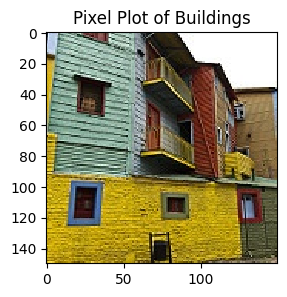

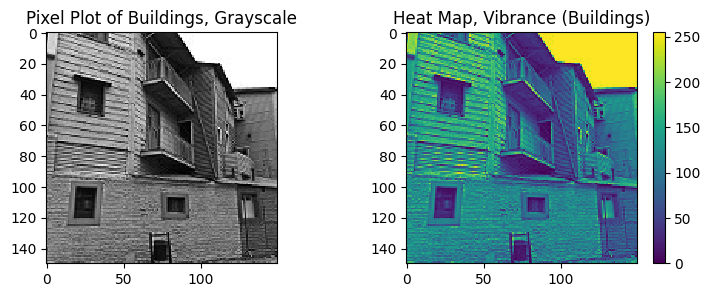

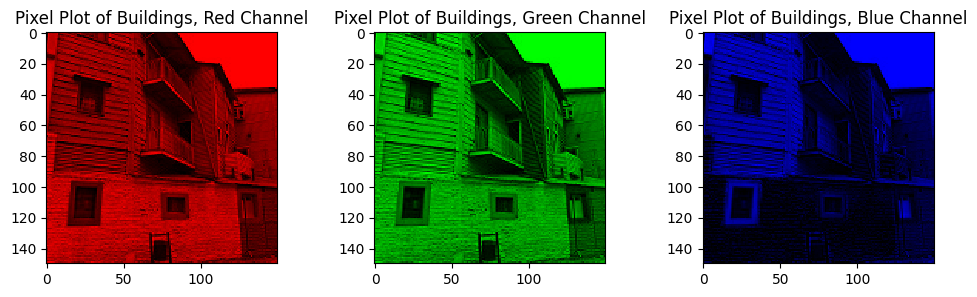

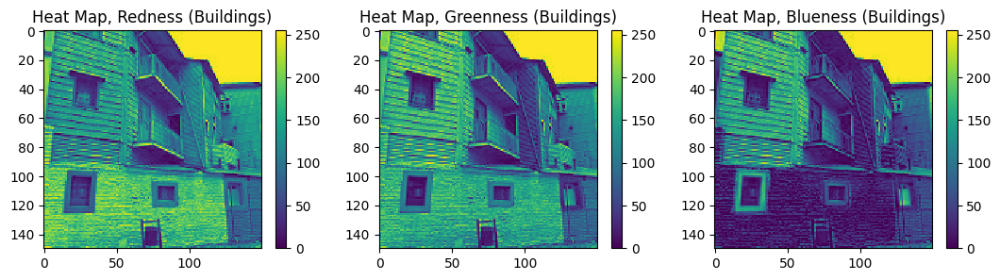

Image type: Forest
Image size: (150, 150, 3)


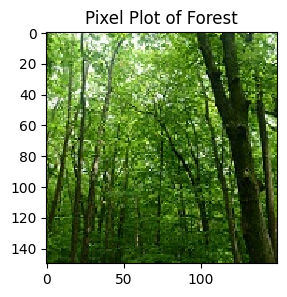

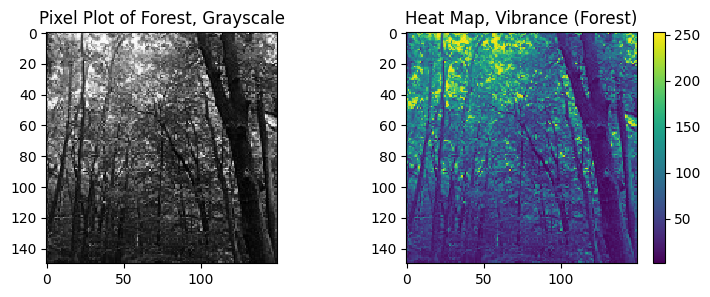

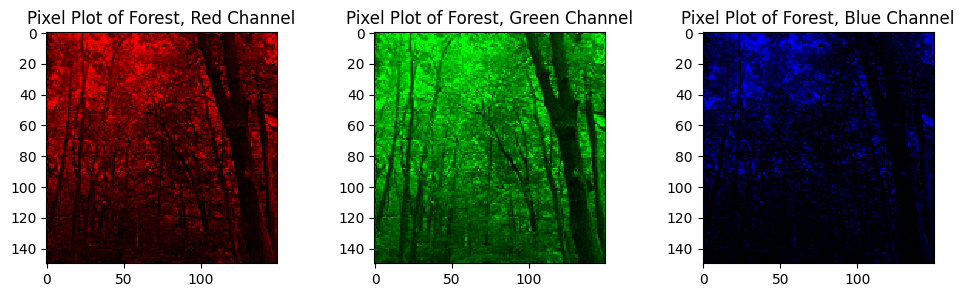

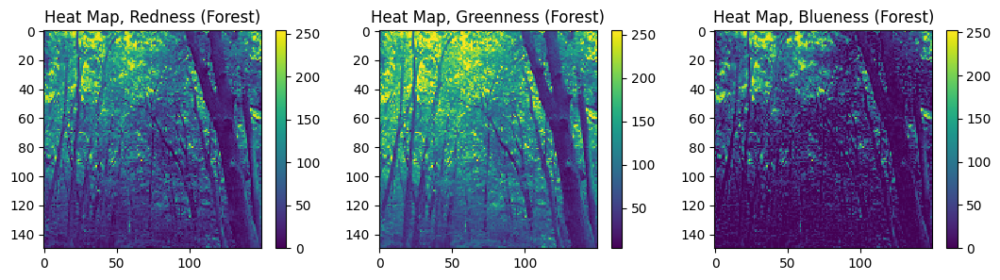

Image type: Glacier
Image size: (150, 150, 3)


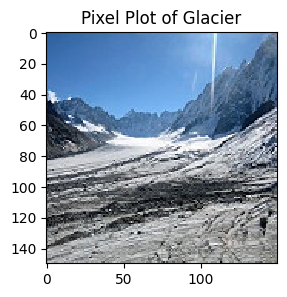

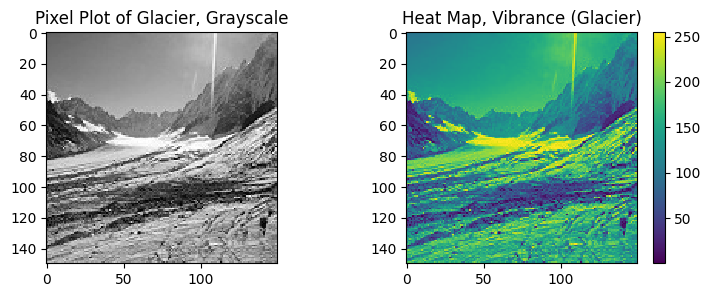

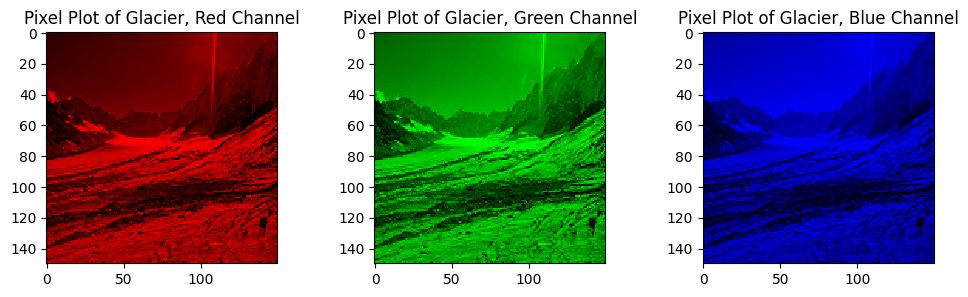

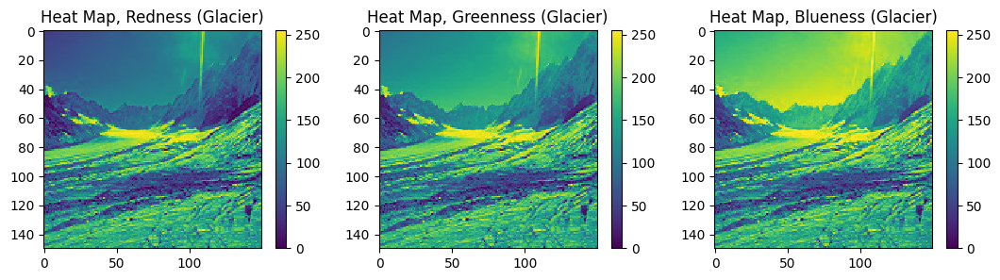

Image type: Mountain
Image size: (150, 150, 3)


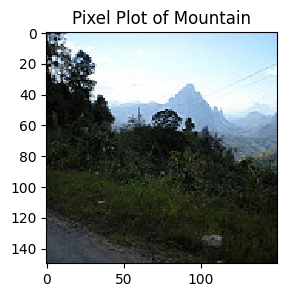

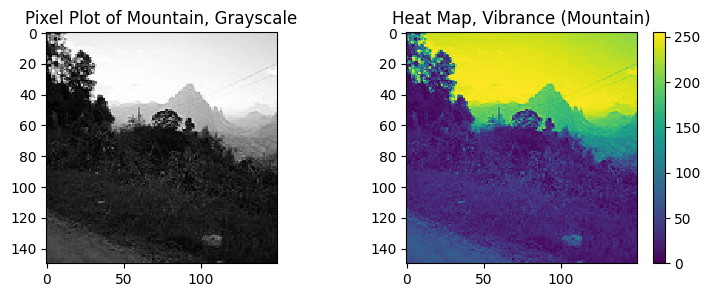

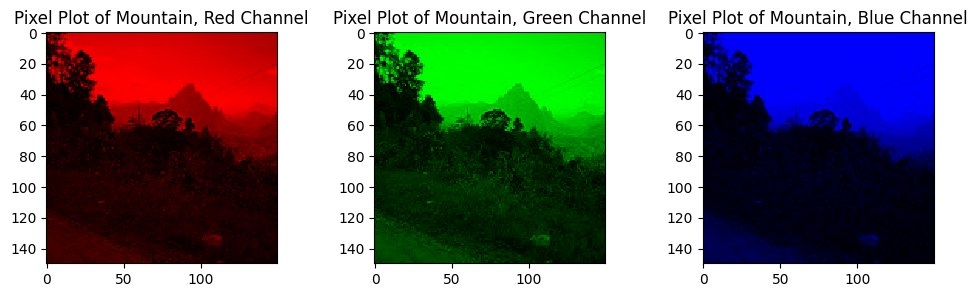

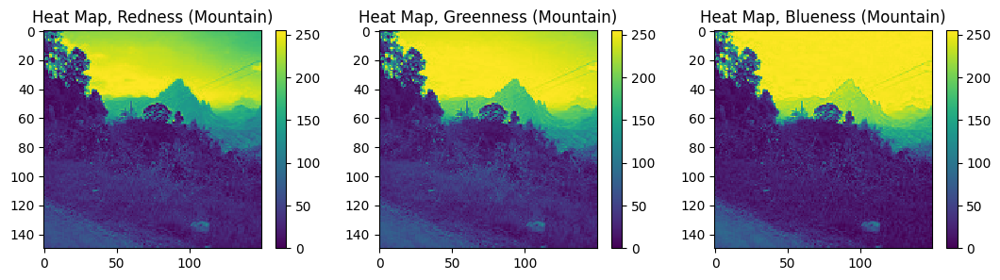

Image type: Sea
Image size: (150, 150, 3)


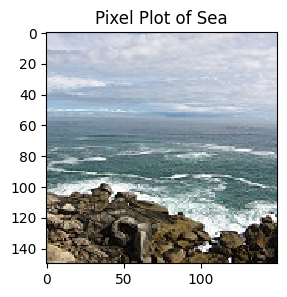

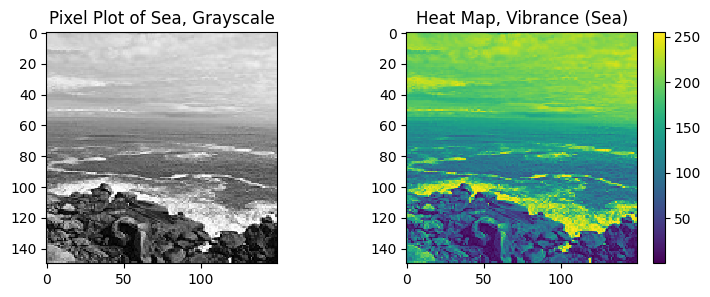

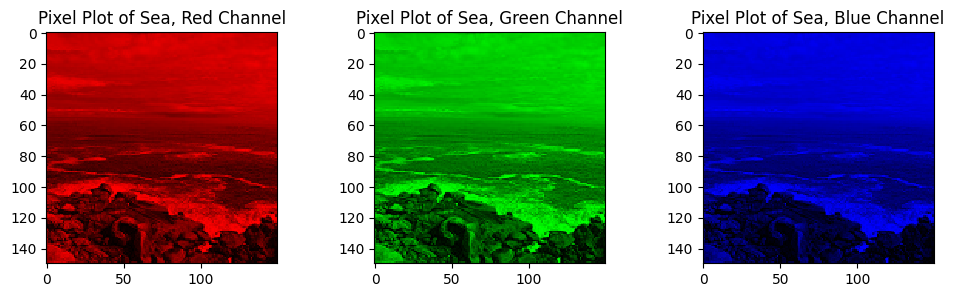

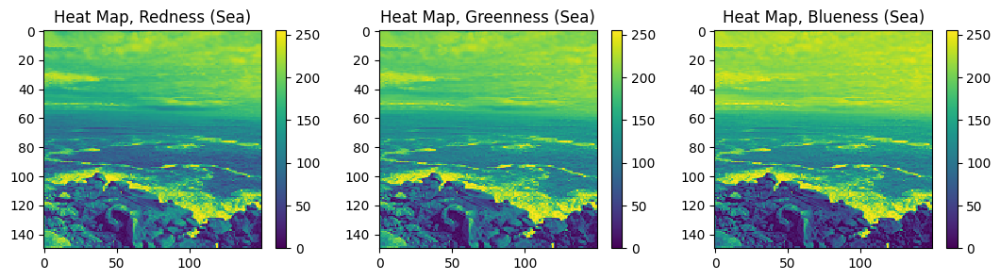

Image type: Street
Image size: (150, 150, 3)


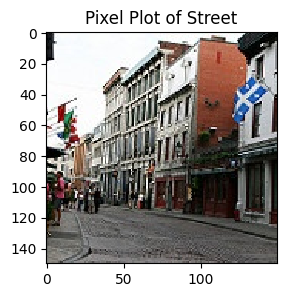

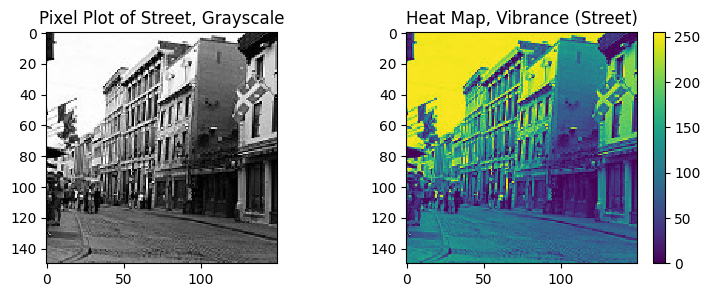

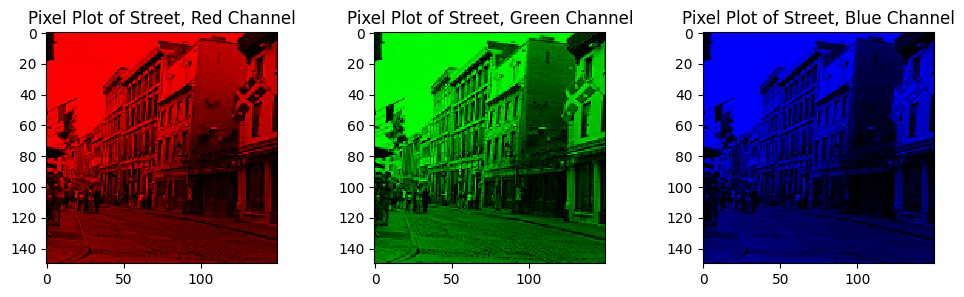

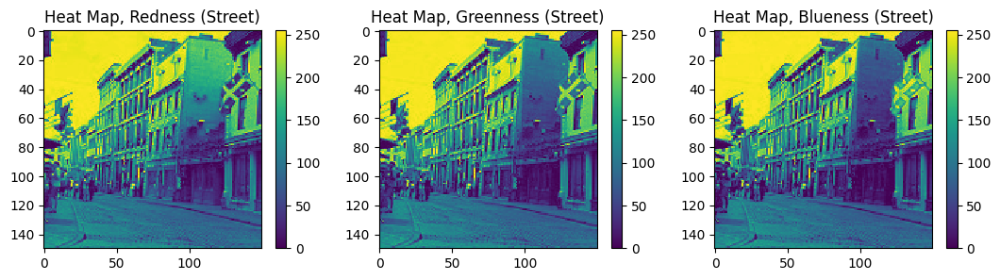

In [61]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns

path = "intel-data/seg_train/seg_train"

def image_analysis(image_path, image_type):
    image = mpimg.imread(image_path)
    print("Image type:", image_type)
    print("Image size:", image.shape)

    plt.figure(figsize=(5, 3))
    plt.imshow(image, interpolation='nearest')
    plt.title('Pixel Plot of ' + image_type)
    plt.show()
    
    plt.figure(figsize=(9, 3))
    plt.subplot(1, 2, 1)
    gray_image = np.mean(image, axis=2)
    plt.imshow(gray_image, interpolation='nearest', cmap='gray')
    plt.title('Pixel Plot of ' + image_type + ', Grayscale')
    plt.subplot(1, 2, 2)
    plt.imshow(gray_image, interpolation='nearest')
    plt.title('Heat Map, Vibrance (' + image_type + ')')
    plt.colorbar()
    plt.show()
    
    plt.figure(figsize=(12, 3))
    plt.subplot(1, 3, 1)
    red_image = image.copy()
    red_image[:, :, 1] = 0
    red_image[:, :, 2] = 0
    plt.imshow(red_image, interpolation='nearest')
    plt.title('Pixel Plot of ' + image_type + ', Red Channel')
    plt.subplot(1, 3, 2)
    green_image = image.copy()
    green_image[:, :, 0] = 0
    green_image[:, :, 2] = 0
    plt.imshow(green_image, interpolation='nearest')
    plt.title('Pixel Plot of ' + image_type + ', Green Channel')
    plt.subplot(1, 3, 3)
    blue_image = image.copy()
    blue_image[:, :, 0] = 0
    blue_image[:, :, 1] = 0
    plt.imshow(blue_image, interpolation='nearest')
    plt.title('Pixel Plot of ' + image_type + ', Blue Channel')
    plt.show()

    plt.figure(figsize=(13, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(image[:, :, 0], interpolation='nearest')
    plt.title('Heat Map, Redness (' + image_type + ')')
    plt.colorbar()
    plt.subplot(1, 3, 2)
    plt.imshow(image[:, :, 1], interpolation='nearest')
    plt.title('Heat Map, Greenness (' + image_type + ')')
    plt.colorbar()
    plt.subplot(1, 3, 3)
    plt.imshow(image[:, :, 2], interpolation='nearest')
    plt.title('Heat Map, Blueness (' + image_type + ')')
    plt.colorbar()
    plt.show()

image_analysis(path + "/buildings/4.jpg", "Buildings")
image_analysis(path + "/forest/8.jpg", "Forest")
image_analysis(path + "/glacier/10.jpg", "Glacier")
image_analysis(path + "/mountain/16.jpg", "Mountain")
image_analysis(path + "/sea/7.jpg", "Sea")
image_analysis(path + "/street/9.jpg", "Street")

### Now that we have our flattened feature matrix `X`, and label vector `y`, here are some key EDA steps to understand how the RGB channels vary by class

#### Compute per class channel means and standard deviations:

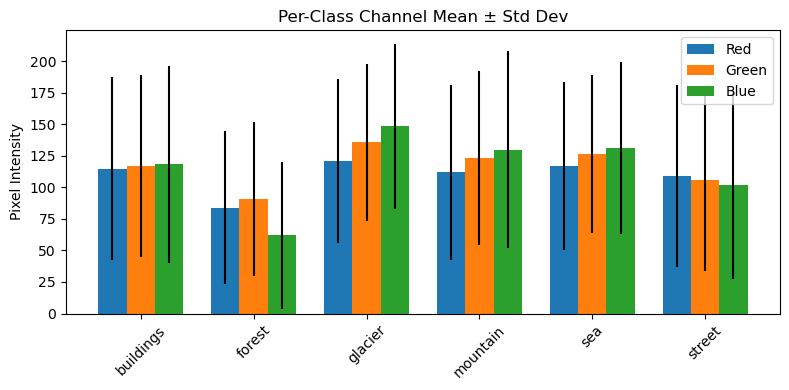

In [ ]:
# Precompute channel slices
R = X[:, 0::3]
G = X[:, 1::3]
B = X[:, 2::3]

means = {'R': [], 'G': [], 'B': []}
stds  = {'R': [], 'G': [], 'B': []}

for i, cls in enumerate(classes):
    idx = np.where(y == i)
    means['R'].append(R[idx].mean())
    means['G'].append(G[idx].mean())
    means['B'].append(B[idx].mean())
    stds ['R'].append(R[idx].std())
    stds ['G'].append(G[idx].std())
    stds ['B'].append(B[idx].std())

# Plotting
x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(8,4))
ax.bar(x - width, means['R'], width, yerr=stds['R'], label='Red')
ax.bar(x        , means['G'], width, yerr=stds['G'], label='Green')
ax.bar(x + width, means['B'], width, yerr=stds['B'], label='Blue')
ax.set_xticks(x)
ax.set_xticklabels(classes, rotation=45)
ax.set_ylabel("Pixel Intensity")
ax.set_title("Per-Class Channel Mean ± Std Dev")
ax.legend()
plt.tight_layout()
plt.show()

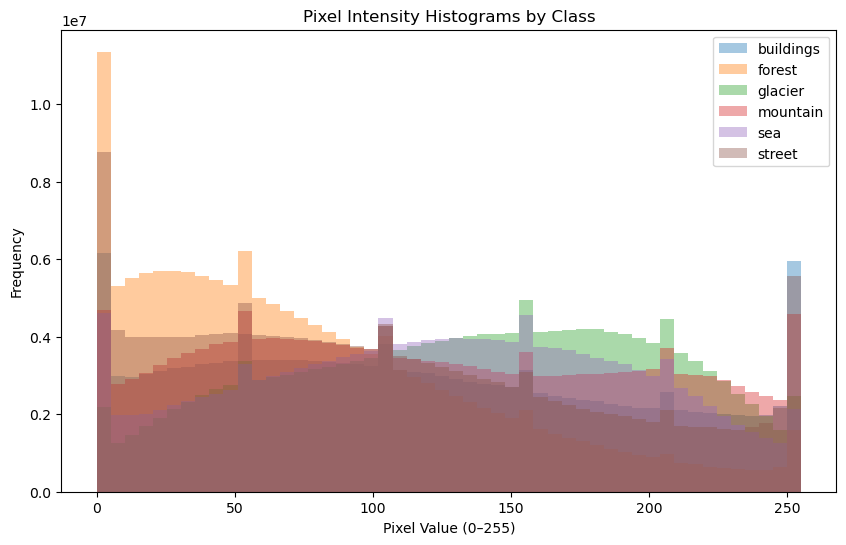

In [ ]:
plt.figure(figsize=(10,6))
for i, cls in enumerate(classes):
    pixels = np.hstack([R[y==i], G[y==i], B[y==i]]).ravel()
    plt.hist(pixels, bins=50, alpha=0.4, label=cls)
plt.xlabel("Pixel Value (0–255)")
plt.ylabel("Frequency")
plt.title("Pixel Intensity Histograms by Class")
plt.legend()
plt.show()

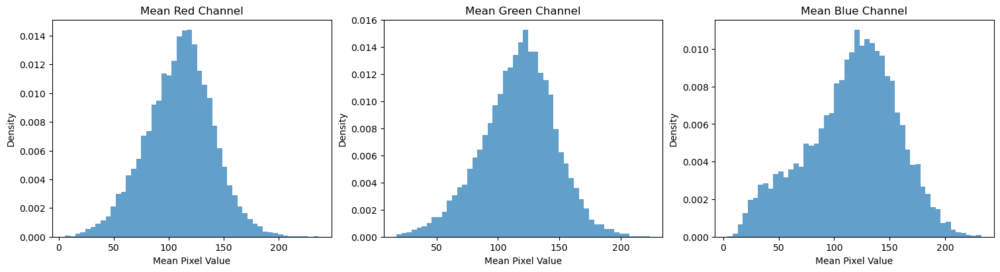

/Users/saiganesh/miniconda3/envs/cenv4py310/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


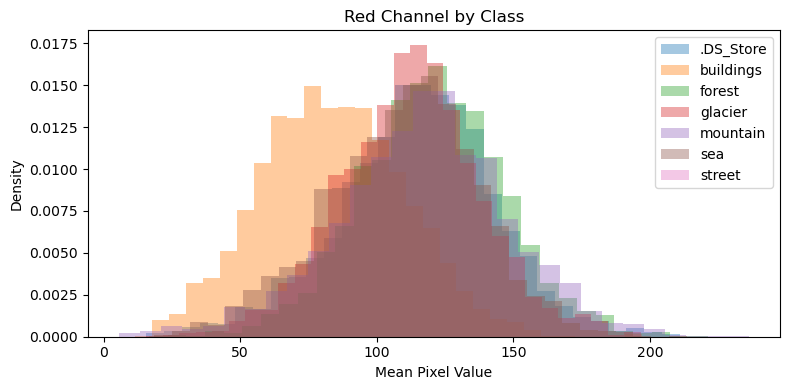

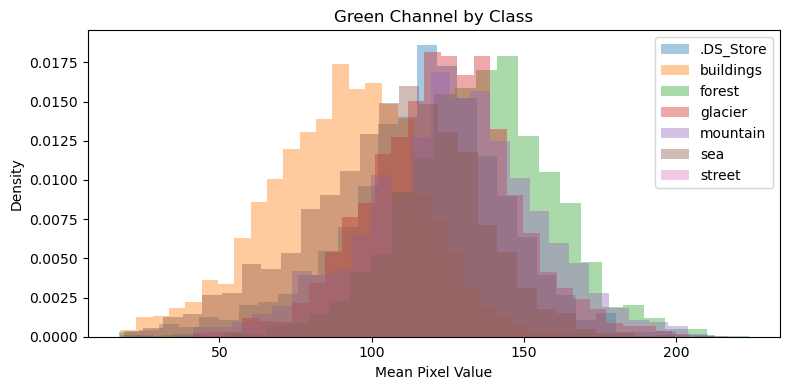

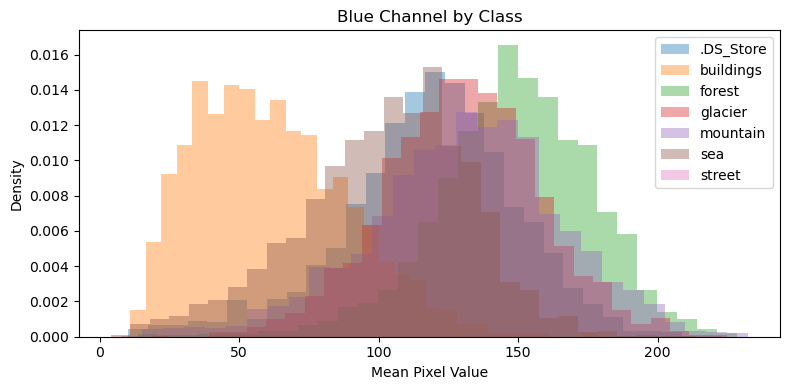

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1) Reshape X back into image form ---
# X.shape == (N_samples, 67500)
N = X.shape[0]
images = X.reshape(N, 150, 150, 3)  # (N, height, width, channels)

# --- 2) Compute per-image mean for each channel ---
mean_R = images[:, :, :, 0].mean(axis=(1, 2))  # shape: (N,)
mean_G = images[:, :, :, 1].mean(axis=(1, 2))
mean_B = images[:, :, :, 2].mean(axis=(1, 2))

# --- 3) Plot overall channel distributions ---
fig, ax = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)
for subplot, data, color in zip(
    ax, [mean_R, mean_G, mean_B], ['Red','Green','Blue']
):
    subplot.hist(data, bins=50, density=True, alpha=0.7)
    subplot.set_title(f"Mean {color} Channel")
    subplot.set_xlabel("Mean Pixel Value")
    subplot.set_ylabel("Density")
plt.show()

# --- 4) (Optional) Per-class overlay histograms ---
for channel_data, channel_name in [(mean_R, 'Red'), (mean_G, 'Green'), (mean_B, 'Blue')]:
    plt.figure(figsize=(8,4))
    for idx, cls in enumerate(classes):
        # select all images of class idx
        vals = channel_data[y == idx]
        plt.hist(vals, bins=30, density=True, alpha=0.4, label=cls)
    plt.title(f"{channel_name} Channel by Class")
    plt.xlabel("Mean Pixel Value")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.show()

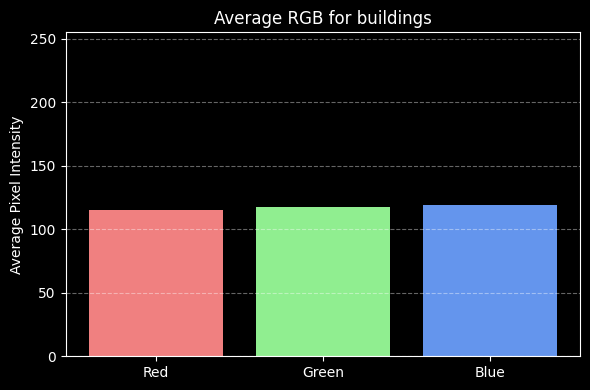

Red Values: 114.9578952 Green Values: 117.70725088888888 Blue Values: 119.25284079999999


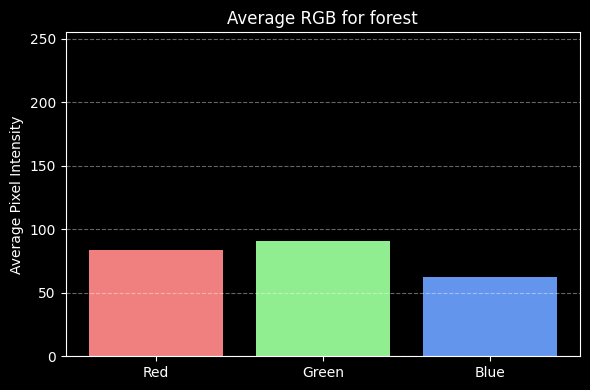

Red Values: 83.60148182896839 Green Values: 90.75269274324161 Blue Values: 62.11526489319829


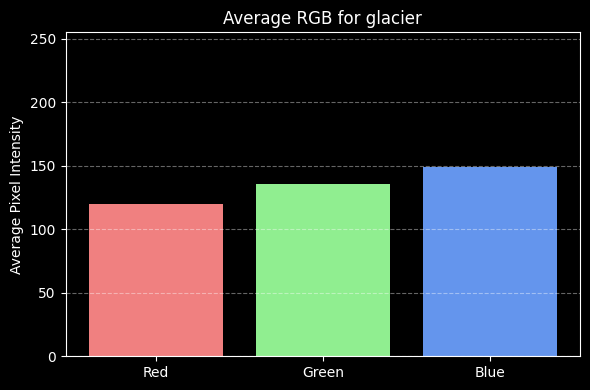

Red Values: 120.22868287230622 Green Values: 135.64846930806902 Blue Values: 148.60571025987997


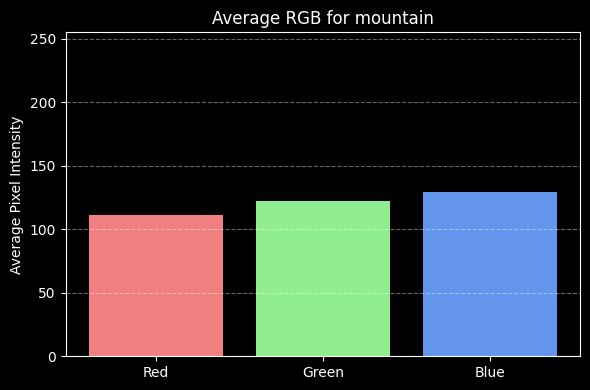

Red Values: 111.04089869760975 Green Values: 122.1362066056687 Blue Values: 129.11565700030286


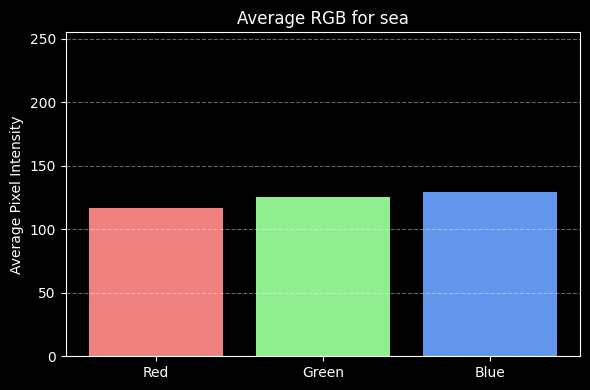

Red Values: 116.83114688888888 Green Values: 125.33914013333333 Blue Values: 129.61095466666666


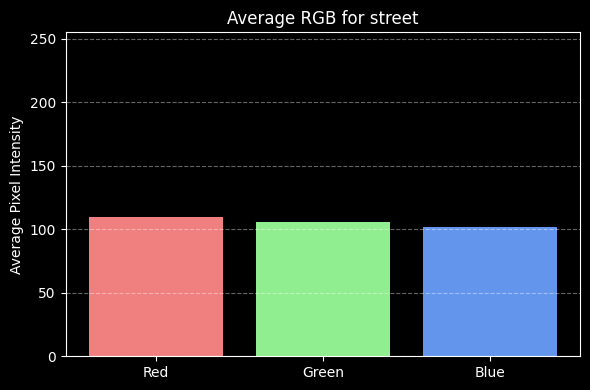

Red Values: 109.3646006300885 Green Values: 105.47596351583087 Blue Values: 101.97045669616519


In [ ]:
import pandas as pd

#define to get values for RGB
def get_rgb(img_path, limit = 1000):
    rval, gval, bval = [],[],[]
    for i, img_file in enumerate(os.listdir(img_path)):
        if i >= limit:
            break
        img = Image.open(os.path.join(img_path, img_file))
        img_arr = np.array(img)

        #get avg of each rgb
        rval.append(img_arr[:, :,0].mean())
        gval.append(img_arr[:, :,1].mean())
        bval.append(img_arr[:, :,2].mean())
    return rval, gval, bval

base_path = "seg_train/seg_train"
class_names = os.listdir(base_path)
data = []

#get values for each class
for c in classes:
    cpath = os.path.join(base_path,c)
    rvals, gvals, bvals = get_rgb(cpath)
    data.append({'class':c, 'red_avg':np.mean(rvals),'green_avg':np.mean(gvals),'blue_avg':np.mean(bvals)})
    
df = pd.DataFrame(data)

#plot values for each class via bar graph
for i, row in df.iterrows():
    plt.style.use('dark_background')
    plt.figure(figsize=(6,4))
    plt.bar(['Red','Green','Blue'], [row['red_avg'], row['green_avg'],row['blue_avg']], color=['lightcoral','lightgreen','cornflowerblue'])
    plt.title(f"Average RGB for {row['class']}")
    plt.ylim(0,255)
    plt.ylabel("Average Pixel Intensity")
    plt.grid(axis='y',linestyle='--',alpha=0.4)
    plt.tight_layout()
    plt.show()
    print("Red Values:", row['red_avg'],"Green Values:",row['green_avg'],"Blue Values:",row['blue_avg'])